In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Input, BatchNormalization, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical

In [ ]:
  # Define dataset directories and parameters
  train_dir = r'C:\Users\acer\OneDrive\Desktop\CAPSTONE\TRAIN_CAPSTONE'
  test_dir = r'C:\Users\acer\OneDrive\Desktop\CAPSTONE\TEST_CAPSTONE'
  IMG_SIZE = (224, 224)
  BATCH_SIZE = 64
  NUM_CLASSES = 2

In [ ]:
label_encoder = LabelEncoder()


In [ ]:
# Define the path to your training directory
train_dir = r'C:\Users\acer\OneDrive\Desktop\CAPSTONE\TRAIN_CAPSTONE'

# Get the list of class names from the folder names
classes = os.listdir(train_dir)

print("Classes:", classes)

Classes: ['fire_images_pre_done', 'non_fire_images_pre_done']


In [ ]:
# Define the classes
classes = ['fire_images_pre_done', 'non_fire_images_pre_done']

# Number of classes
num_classes = len(classes)

# Print the classes
print("Classes:", classes)
print("Number of classes:", num_classes)

# Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)

# Load and preprocess training dataset with labels
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

train_labels = train_generator.classes
train_labels = label_encoder.fit_transform(train_labels)
train_one_hot_labels = to_categorical(train_labels, num_classes=len(classes))



Classes: ['fire_images_pre_done', 'non_fire_images_pre_done']
Number of classes: 2
Found 5124 images belonging to 2 classes.


In [ ]:


# Load and preprocess test dataset with labels
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

test_labels = test_generator.classes
test_labels = label_encoder.transform(test_labels)
test_one_hot_labels = to_categorical(test_labels, num_classes=len(classes))




Found 200 images belonging to 2 classes.


Epoch 1/40


C:\Users\acer\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


81/81 ━━━━━━━━━━━━━━━━━━━━ 651s 7s/step - accuracy: 0.8113 - loss: 1.6003 - val_accuracy: 0.7550 - val_loss: 1.1374
Epoch 2/40
81/81 ━━━━━━━━━━━━━━━━━━━━ 589s 7s/step - accuracy: 0.9403 - loss: 0.2893 - val_accuracy: 0.7550 - val_loss: 0.6937
Epoch 3/40
81/81 ━━━━━━━━━━━━━━━━━━━━ 594s 7s/step - accuracy: 0.9273 - loss: 0.2749 - val_accuracy: 0.7550 - val_loss: 1.6308
Epoch 4/40
81/81 ━━━━━━━━━━━━━━━━━━━━ 581s 7s/step - accuracy: 0.9569 - loss: 0.1383 - val_accuracy: 0.7550 - val_loss: 2.0568
Epoch 5/40
81/81 ━━━━━━━━━━━━━━━━━━━━ 579s 7s/step - accuracy: 0.9396 - loss: 0.2732 - val_accuracy: 0.7550 - val_loss: 0.6191
Epoch 6/40
81/81 ━━━━━━━━━━━━━━━━━━━━ 571s 7s/step - accuracy: 0.9276 - loss: 0.2871 - val_accuracy: 0.7550 - val_loss: 1.2982
Epoch 7/40
81/81 ━━━━━━━━━━━━━━━━━━━━ 572s 7s/step - accuracy: 0.9567 - loss: 0.1301 - val_accuracy: 0.7550 - val_loss: 2.2343
Epoch 8/40
81/81 ━━━━━━━━━━━━━━━━━━━━ 579s 7s/step - accuracy: 0.9642 - loss: 0.0959 - val_accuracy: 0.7850 - val_loss: 0.

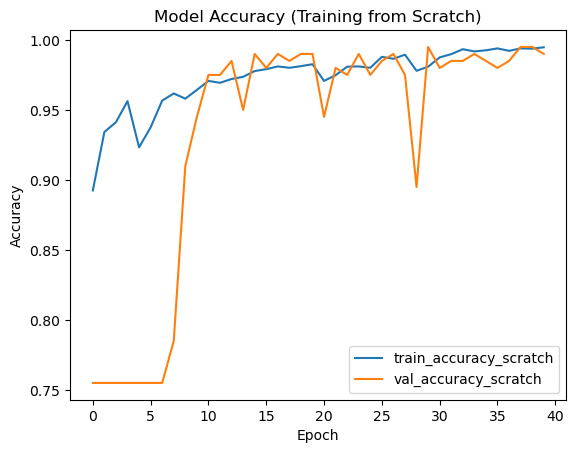

In [ ]:
# Define and compile the model for training from scratch
base_model_scratch = EfficientNetB0(
    include_top=True,
    weights=None,  # No pre-trained weights, training from scratch
    classes=NUM_CLASSES,
    input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3)
)

base_model_scratch.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model from scratch
history_scratch = base_model_scratch.fit(train_generator, epochs=40, validation_data=test_generator)

# Plot training history for the scratch model
plt.plot(history_scratch.history["accuracy"], label="train_accuracy_scratch")
plt.plot(history_scratch.history["val_accuracy"], label="val_accuracy_scratch")
plt.title("Model Accuracy (Training from Scratch)")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
# Save the model
base_model_scratch.save("/content/my_model.h5")


In [ ]:
# Save the model in the native Keras format
base_model_scratch.save(r"C:\Users\acer\OneDrive\Desktop\CAPSTONE\forest_fire.keras")


In [ ]:

from tensorflow.keras.models import load_model

loaded_model = load_model("/content/my_model.keras")


C:\Users\acer\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:418: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 215 variables whereas the saved optimizer has 428 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


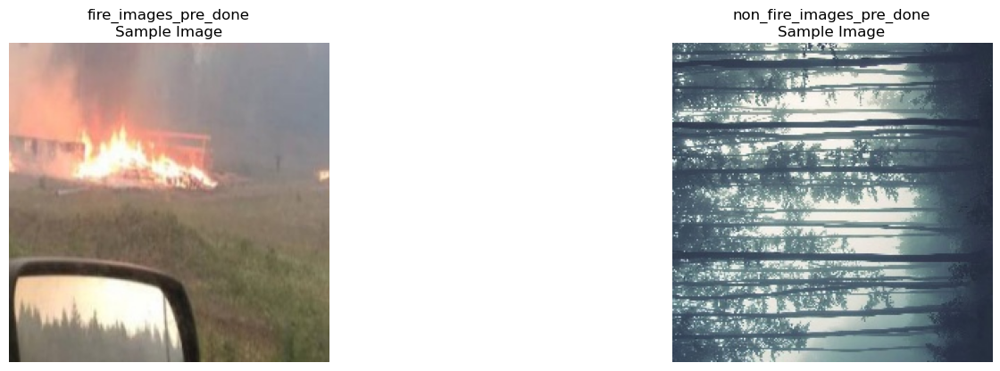

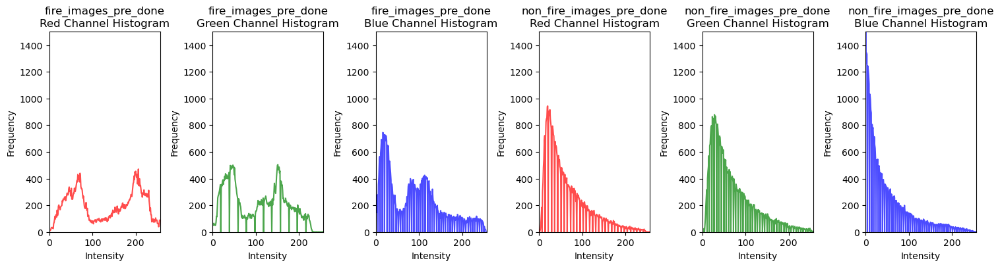

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

# Assuming you have defined `classes` and `dataset_dir`

plt.figure(figsize=(15, 8))
for i, class_name in enumerate(classes, 1):
    class_dir = os.path.join(dataset_dir, class_name)
    image_files = os.listdir(class_dir)
    sample_image_path = os.path.join(class_dir, np.random.choice(image_files))
    sample_image = cv2.imread(sample_image_path)
    sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    plt.subplot(2, len(classes), i)
    plt.imshow(sample_image)
    plt.title(f'{class_name}\nSample Image')
    plt.axis('off')
plt.tight_layout()  # Ensure proper spacing between subplots

plt.figure(figsize=(15, 8))
for i, class_name in enumerate(classes, 1):
    class_dir = os.path.join(dataset_dir, class_name)
    image_files = os.listdir(class_dir)
    sample_image_path = os.path.join(class_dir, np.random.choice(image_files))
    sample_image = cv2.imread(sample_image_path)
    sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    for j, channel in enumerate(['Red', 'Green', 'Blue'], 1):
        plt.subplot(2, 3 * len(classes), len(classes) * 3 + (i - 1) * 3 + j)
        hist, bins = np.histogram(sample_image[..., j-1].ravel(), bins=256)
        plt.plot(hist, color=channel.lower(), alpha=0.7)
        plt.xlim([0, 256])
        plt.ylim([0, 1500])  # Set the y-axis limit to 6000
        plt.title(f'{class_name}\n{channel} Channel Histogram')
        plt.xlabel('Intensity')
        plt.ylabel('Frequency')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout parameters to provide more space between subplots
plt.show()


In [ ]:
dataset_dir = r'C:\Users\acer\OneDrive\Desktop\CAPSTONE\TRAIN_CAPSTONE'

4/4 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step


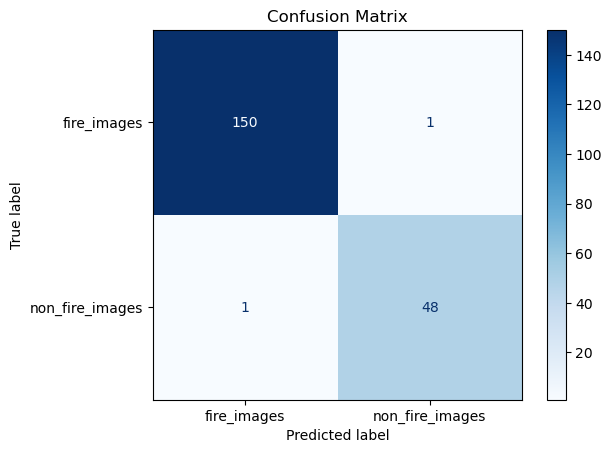

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Assuming you have defined test_generator and transfer_model before

# Calculate predictions on the test set
predictions = base_model_scratch.predict(test_generator)

# Convert predictions and true labels to binary format
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes


# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Display confusion matrix
labels = list(test_generator.class_indices.keys())
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Visualizing feature maps for input_layer:


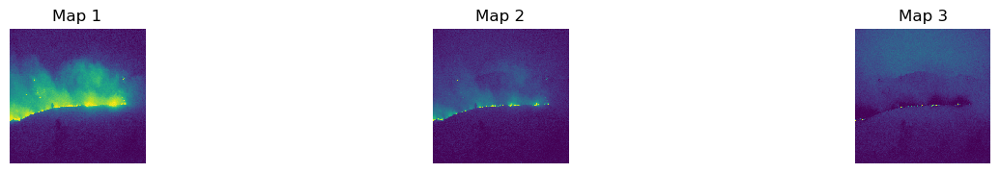

Visualizing feature maps for rescaling:


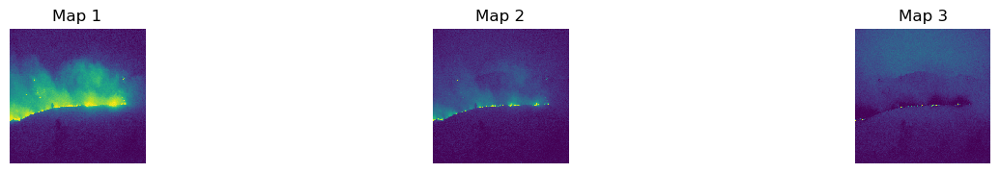

Visualizing feature maps for normalization:


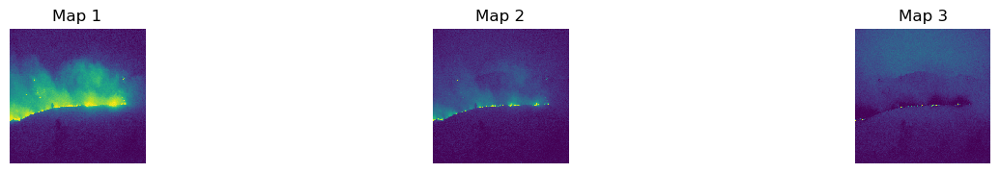

Visualizing feature maps for stem_conv_pad:


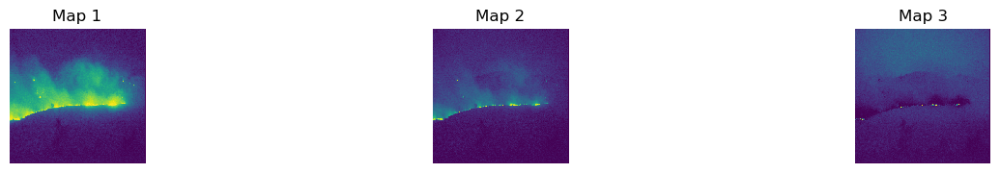

Visualizing feature maps for stem_conv:


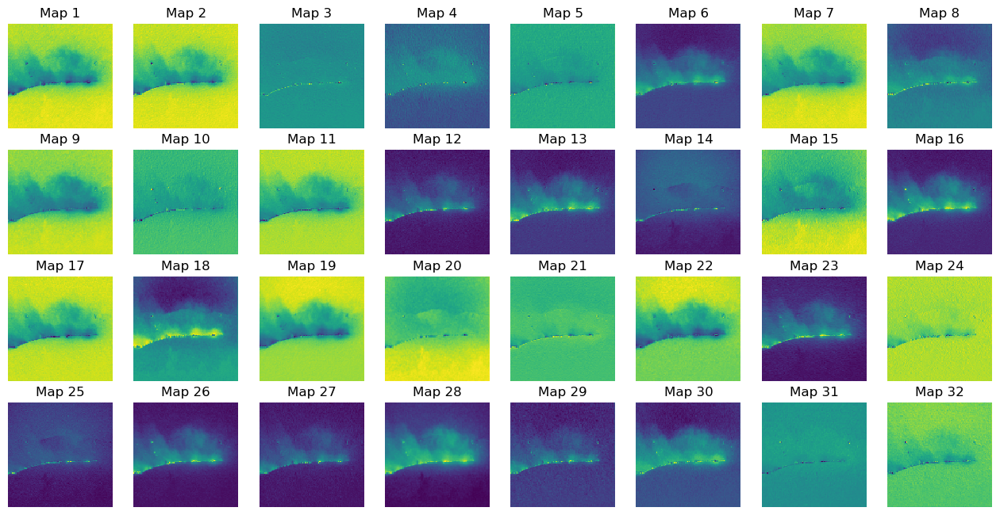

Visualizing feature maps for stem_bn:


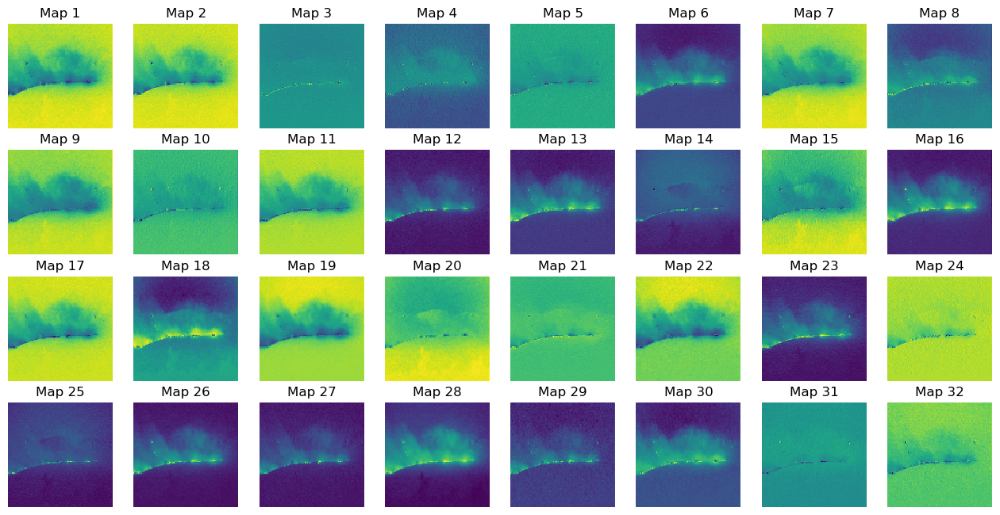

Visualizing feature maps for stem_activation:


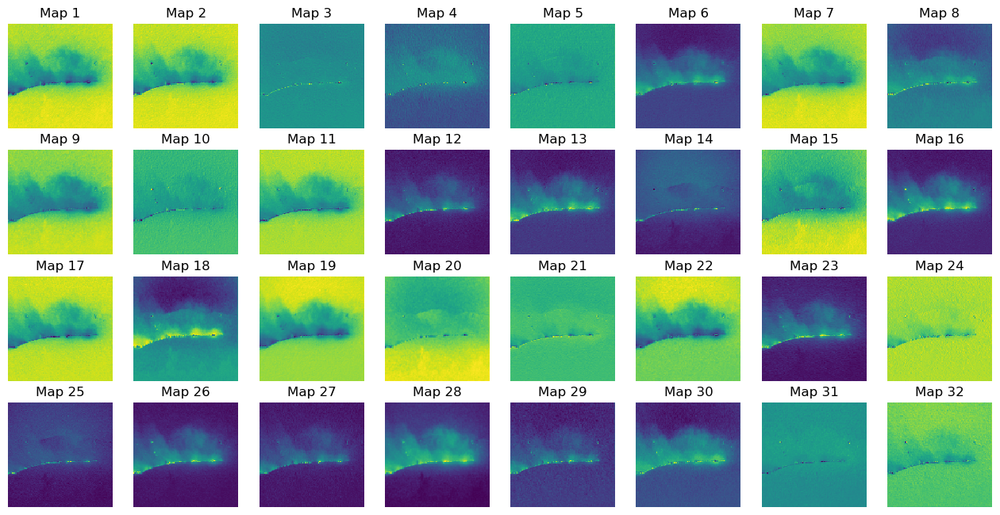

Visualizing feature maps for block1a_dwconv:


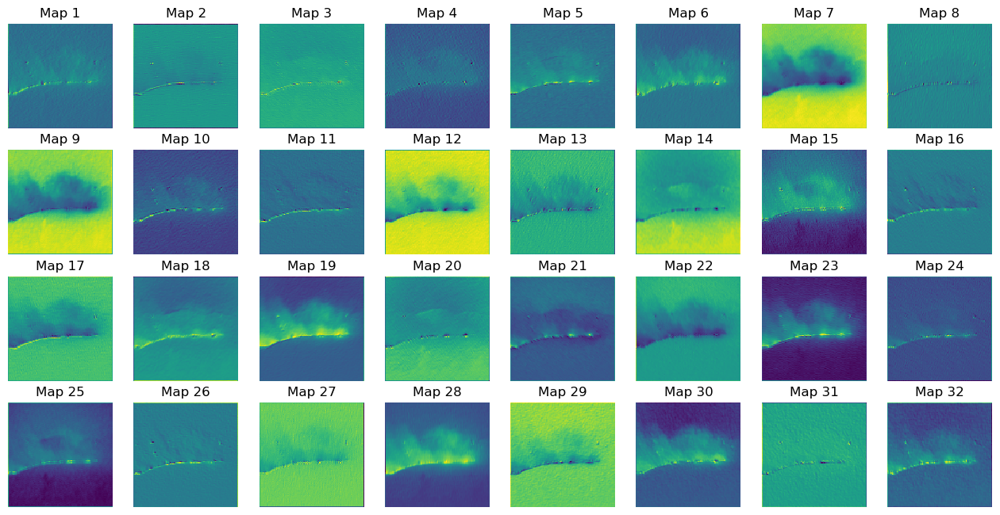

Visualizing feature maps for block1a_bn:


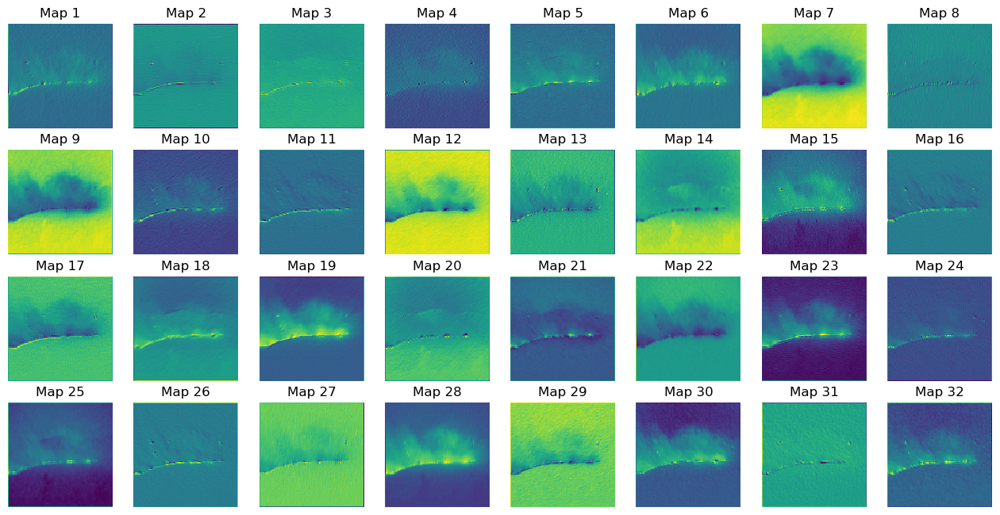

Visualizing feature maps for block1a_activation:


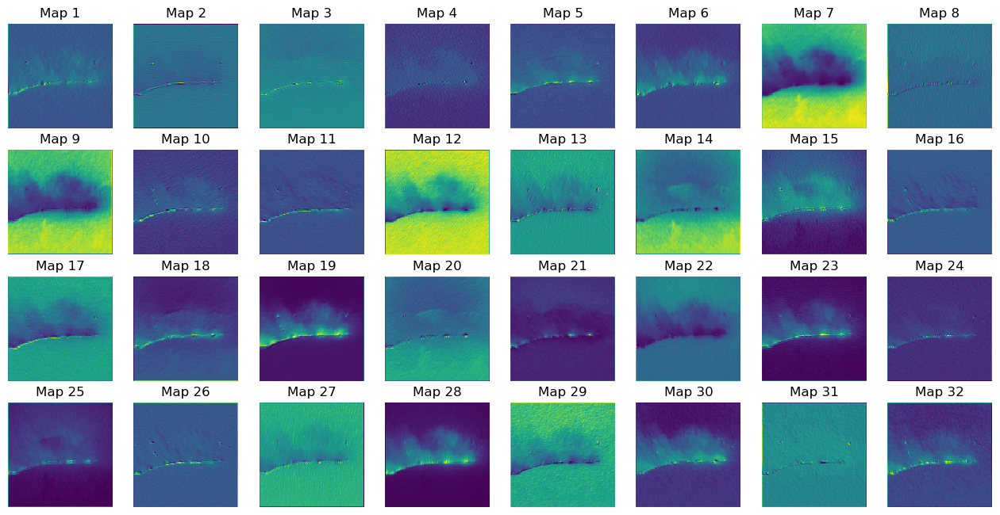

Visualizing feature maps for block1a_se_squeeze:


IndexError: too many indices for array: array is 2-dimensional, but 4 were indexed

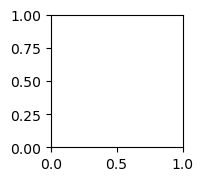

In [ ]:
import numpy as np

# Select random 2-3 images from your test dataset
num_images = 3
random_indices = np.random.choice(len(test_generator), num_images, replace=False)
sample_images = [test_generator[i][0][0] for i in random_indices]  # Grabbing the first batch and the first image from each batch



# Define a new model to extract feature maps from all layers
feature_extraction_model = Model(inputs=base_model_scratch.input,
                                  outputs=[layer.output for layer in base_model_scratch.layers])

# Extract feature maps for the selected images
feature_maps_list = feature_extraction_model.predict(np.array(sample_images))

# Plot feature maps for each layer and each image
for layer_index, feature_maps in enumerate(feature_maps_list):
    layer_name = base_model_scratch.layers[layer_index].name
    print(f"Visualizing feature maps for {layer_name}:")
    num_maps = feature_maps.shape[-1]
    num_cols = min(8, num_maps)  # Maximum 8 columns
    num_rows = (num_maps // num_cols) + 1
    plt.figure(figsize=(16, 2 * num_rows))
    for j in range(num_maps):
        plt.subplot(num_rows, num_cols, j+1)
        plt.imshow(feature_maps[0, :, :, j], cmap='viridis', interpolation='nearest')  # Visualize only the first image
        plt.title(f'Map {j+1}')
        plt.axis('off')
    plt.show()




1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


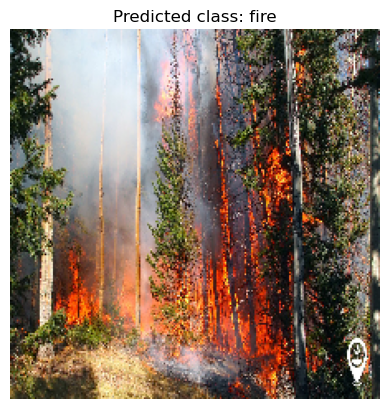

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Define the path to your saved model
model_path = r"C:\Users\acer\OneDrive\Desktop\CAPSTONE\forest_fire.keras"

# Load the model
loaded_model = load_model(model_path)

# Define a function to make predictions on single images
def predict_single_image(image_path, model):
    img = image.load_img(image_path, target_size=(224, 224))  # Load the image
    img_array = image.img_to_array(img)  # Convert to numpy array
    img_array = np.expand_dims(img_array, axis=0)  # Expand dimensions to match batch shape
    img_array /= 255.  # Normalize the image

    # Make prediction
    prediction = model.predict(img_array)
    predicted_class_idx = np.argmax(prediction)
    class_names = ['fire', 'non-fire']  # Define your class names
    predicted_class = class_names[predicted_class_idx]

    # Plot the image with the predicted class as title
    plt.imshow(img)
    plt.title("Predicted class: " + predicted_class)
    plt.axis('off')
    plt.show()

# Example usage
test_image_path = r'C:\Users\acer\OneDrive\Desktop\test_cap_1.jpg'
predict_single_image(test_image_path, loaded_model)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


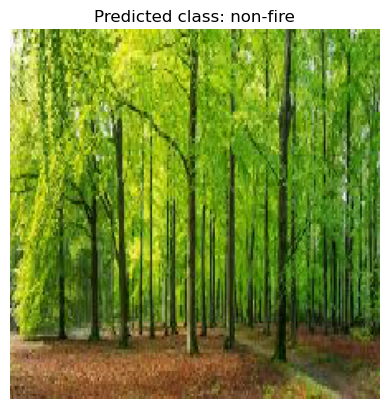

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Define the path to your saved model
model_path = r"C:\Users\acer\OneDrive\Desktop\CAPSTONE\forest_fire.keras"

# Load the model
loaded_model = load_model(model_path)

# Define a function to make predictions on single images
def predict_single_image(image_path, model):
    img = image.load_img(image_path, target_size=(224, 224))  # Load the image
    img_array = image.img_to_array(img)  # Convert to numpy array
    img_array = np.expand_dims(img_array, axis=0)  # Expand dimensions to match batch shape
    img_array /= 255.  # Normalize the image

    # Make prediction
    prediction = model.predict(img_array)
    predicted_class_idx = np.argmax(prediction)
    class_names = ['fire', 'non-fire']  # Define your class names
    predicted_class = class_names[predicted_class_idx]

    # Plot the image with the predicted class as title
    plt.imshow(img)
    plt.title("Predicted class: " + predicted_class)
    plt.axis('off')
    plt.show()

# Example usage
test_image_path = r'C:\Users\acer\OneDrive\Desktop\test_cap_2.jpg'
predict_single_image(test_image_path, loaded_model)




1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


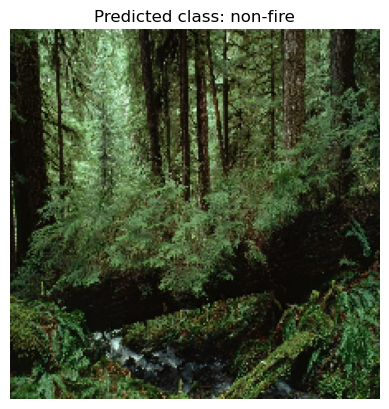

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Define the path to your saved model
model_path = r"C:\Users\acer\OneDrive\Desktop\CAPSTONE\forest_fire.keras"

# Load the model
loaded_model = load_model(model_path)

# Define a function to make predictions on single images
def predict_single_image(image_path, model):
    img = image.load_img(image_path, target_size=(224, 224))  # Load the image
    img_array = image.img_to_array(img)  # Convert to numpy array
    img_array = np.expand_dims(img_array, axis=0)  # Expand dimensions to match batch shape
    img_array /= 255.  # Normalize the image

    # Make prediction
    prediction = model.predict(img_array)
    predicted_class_idx = np.argmax(prediction)
    class_names = ['fire', 'non-fire']  # Define your class names
    predicted_class = class_names[predicted_class_idx]

    # Plot the image with the predicted class as title
    plt.imshow(img)
    plt.title("Predicted class: " + predicted_class)
    plt.axis('off')
    plt.show()

# Example usage
test_image_path = r'C:\Users\acer\OneDrive\Desktop\bhushan_test_1.jpg'
predict_single_image(test_image_path, loaded_model)




1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


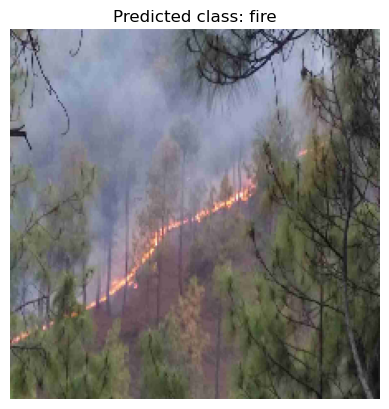

In [ ]:


import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Define the path to your saved model
model_path = r"C:\Users\acer\OneDrive\Desktop\CAPSTONE\forest_fire.keras"

# Load the model
loaded_model = load_model(model_path)

# Define a function to make predictions on single images
def predict_single_image(image_path, model):
    img = image.load_img(image_path, target_size=(224, 224))  # Load the image
    img_array = image.img_to_array(img)  # Convert to numpy array
    img_array = np.expand_dims(img_array, axis=0)  # Expand dimensions to match batch shape
    img_array /= 255.  # Normalize the image

    # Make prediction
    prediction = model.predict(img_array)
    predicted_class_idx = np.argmax(prediction)
    class_names = ['fire', 'non-fire']  # Define your class names
    predicted_class = class_names[predicted_class_idx]

    # Plot the image with the predicted class as title
    plt.imshow(img)
    plt.title("Predicted class: " + predicted_class)
    plt.axis('off')
    plt.show()

# Example usage
test_image_path = r'C:\Users\acer\OneDrive\Desktop\bhushan_test_2.jpg'
predict_single_image(test_image_path, loaded_model)




1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


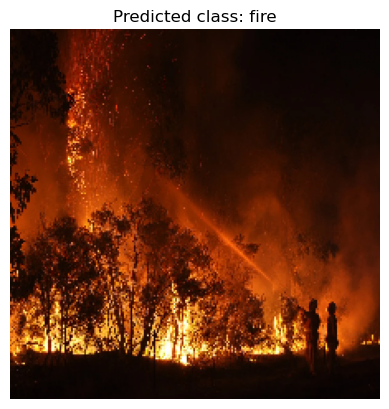

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Define the path to your saved model
model_path = r"C:\Users\acer\OneDrive\Desktop\CAPSTONE\forest_fire.keras"

# Load the model
loaded_model = load_model(model_path)

# Define a function to make predictions on single images
def predict_single_image(image_path, model):
    img = image.load_img(image_path, target_size=(224, 224))  # Load the image
    img_array = image.img_to_array(img)  # Convert to numpy array
    img_array = np.expand_dims(img_array, axis=0)  # Expand dimensions to match batch shape
    img_array /= 255.  # Normalize the image

    # Make prediction
    prediction = model.predict(img_array)
    predicted_class_idx = np.argmax(prediction)
    class_names = ['fire', 'non-fire']  # Define your class names
    predicted_class = class_names[predicted_class_idx]

    # Plot the image with the predicted class as title
    plt.imshow(img)
    plt.title("Predicted class: " + predicted_class)
    plt.axis('off')
    plt.show()

# Example usage
test_image_path = r'C:\Users\acer\OneDrive\Desktop\test_final.jpg'
predict_single_image(test_image_path, loaded_model)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


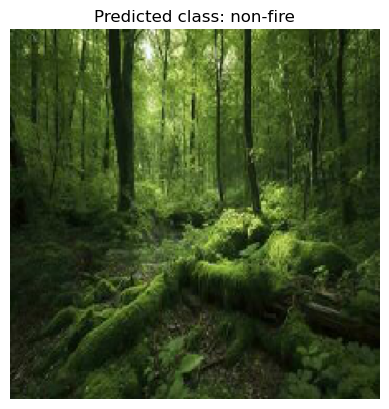

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Define the path to your saved model
model_path = r"C:\Users\acer\OneDrive\Desktop\CAPSTONE\forest_fire.keras"

# Load the model
loaded_model = load_model(model_path)

# Define a function to make predictions on single images
def predict_single_image(image_path, model):
    img = image.load_img(image_path, target_size=(224, 224))  # Load the image
    img_array = image.img_to_array(img)  # Convert to numpy array
    img_array = np.expand_dims(img_array, axis=0)  # Expand dimensions to match batch shape
    img_array /= 255.  # Normalize the image

    # Make prediction
    prediction = model.predict(img_array)
    predicted_class_idx = np.argmax(prediction)
    class_names = ['fire', 'non-fire']  # Define your class names
    predicted_class = class_names[predicted_class_idx]

    # Plot the image with the predicted class as title
    plt.imshow(img)
    plt.title("Predicted class: " + predicted_class)
    plt.axis('off')
    plt.show()

# Example usage
test_image_path = r'C:\Users\acer\OneDrive\Desktop\forest_final.jpg'
predict_single_image(test_image_path, loaded_model)




1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


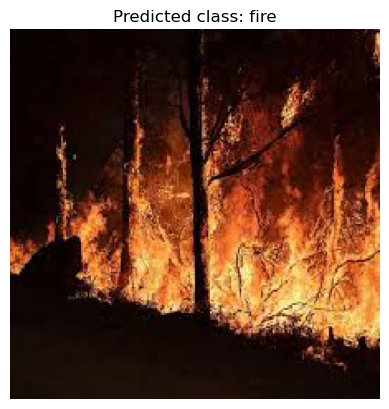

In [ ]:


import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Define the path to your saved model
model_path = r"C:\Users\acer\OneDrive\Desktop\CAPSTONE\forest_fire.keras"

# Load the model
loaded_model = load_model(model_path)

# Define a function to make predictions on single images
def predict_single_image(image_path, model):
    img = image.load_img(image_path, target_size=(224, 224))  # Load the image
    img_array = image.img_to_array(img)  # Convert to numpy array
    img_array = np.expand_dims(img_array, axis=0)  # Expand dimensions to match batch shape
    img_array /= 255.  # Normalize the image

    # Make prediction
    prediction = model.predict(img_array)
    predicted_class_idx = np.argmax(prediction)
    class_names = ['fire', 'non-fire']  # Define your class names
    predicted_class = class_names[predicted_class_idx]

    # Plot the image with the predicted class as title
    plt.imshow(img)
    plt.title("Predicted class: " + predicted_class)
    plt.axis('off')
    plt.show()

# Example usage
test_image_path = r'C:\Users\acer\OneDrive\Desktop\sid.jpeg'
predict_single_image(test_image_path, loaded_model)




1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


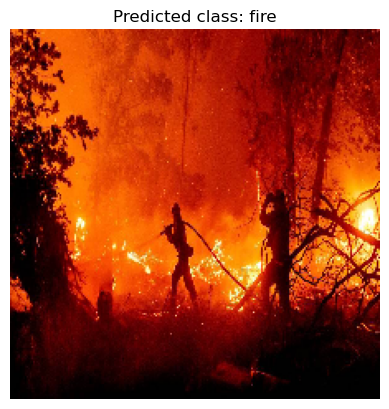

In [ ]:


import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Define the path to your saved model
model_path = r"C:\Users\acer\OneDrive\Desktop\CAPSTONE\forest_fire.keras"

# Load the model
loaded_model = load_model(model_path)

# Define a function to make predictions on single images
def predict_single_image(image_path, model):
    img = image.load_img(image_path, target_size=(224, 224))  # Load the image
    img_array = image.img_to_array(img)  # Convert to numpy array
    img_array = np.expand_dims(img_array, axis=0)  # Expand dimensions to match batch shape
    img_array /= 255.  # Normalize the image

    # Make prediction
    prediction = model.predict(img_array)
    predicted_class_idx = np.argmax(prediction)
    class_names = ['fire', 'non-fire']  # Define your class names
    predicted_class = class_names[predicted_class_idx]

    # Plot the image with the predicted class as title
    plt.imshow(img)
    plt.title("Predicted class: " + predicted_class)
    plt.axis('off')
    plt.show()

# Example usage
test_image_path = r'C:\Users\acer\OneDrive\Desktop\implementation.jpg'
predict_single_image(test_image_path, loaded_model)


